# Исследование рынка заведений общественного питания Москвы



## О чем проект

Инвесторы из фонда «Shut Up and Take My Money» решили попробовать себя в новой области и открыть заведение общественного питания в Москве. Заказчики ещё точно не знают, что это будет за место: кафе, ресторан, пиццерия, паб или бар, — и какими будут расположение, меню и цены. Но более детально рассматривают возможность открытия уютной и доступной кофейни.

Нам нужно подготовить исследование рынка общественнго питания Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.

В качестве источника имеем датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. Информация, размещённая в сервисе Яндекс Бизнес, могла быть добавлена пользователями или найдена в общедоступных источниках. Она носит исключительно справочный характер.

**Цели исследования:**
1. Изучить рынок общественного питания Москвы, более детально - рынок кофеен.
2. Разработать рекомендации для заказчика.

**Этапы исследования:**
1. Обзор данных
2. Предобработка данных
3. Анализ данных
4. Детальное исследование возможности открытия кофейни
5. Подготовка презентации

## Обзор данных

In [1]:
# Импортируем нужные библиотеки
import pandas as pd
import scipy.stats as stats
import math as mth
import datetime as dt
import numpy as np
import re
import seaborn as sns
import matplotlib as plt
import matplotlib.pyplot as plt
import plotly.express as px
from plotly import graph_objects as go
import json
import folium
from folium import Map, Choropleth, Marker
from folium.plugins import MarkerCluster
from folium.features import CustomIcon

In [2]:
#Откроем файл  с данными
try:
    data = pd.read_csv('/datasets/moscow_places.csv')
except:
    data = pd.read_csv('moscow_places.csv')

In [3]:
#Изучим содержимое таблицы
display(data.head())

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


In [4]:
data.shape

(8406, 14)

Файл moscow_places.csv состоит из 8406 строк и 14 столбцов.

Столбцы и их содержание:

-	name — название заведения;
-	address — адрес заведения;
-	category — категория заведения, например «кафе», «пиццерия» или «кофейня»;
-	hours — информация о днях и часах работы;
-	lat — широта географической точки, в которой находится заведение;
-	lng — долгота географической точки, в которой находится заведение;
-	rating — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);
-	price — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;
-	avg_bill — строка, которая хранит среднюю стоимость заказа в виде диапазона, например: 
        - «Средний счёт: 1000–1500 ₽»;
        - «Цена чашки капучино: 130–220 ₽»;
        -«Цена бокала пива: 400–600 ₽» и так далее;
-	middle_avg_bill — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»: 
        - Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
        - Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
        - Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.
-	middle_coffee_cup — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»: 
        - Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
        - Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
        - Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.
- 	chain — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки):
        - 0 — заведение не является сетевым
        - 1 — заведение является сетевым
-	district — административный район, в котором находится заведение, например Центральный административный округ;
-	seats — количество посадочных мест.

## Предобработка данных

Предобработку проведем в несколько этапов:
- Проверка на наличие пропусков, заполнение пропусков при возможности
- Проверка на явные и неявные дубликаты
- Добавление новых столбцов, которые упростят в дальнейшем анализ

### Пропуски и дубликаты

In [5]:
#Изучим структуру данных
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


Типы данных соответствуют содержанию.

Пропуски есть в 6 столбцах. 

- hours - информация о днях и часах работы 
- price - категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее              
- avg_bill - строка, которая хранит среднюю стоимость заказа в виде диапазона            
- middle_avg_bill - число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»    
- middle_coffee_cup - число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»  
- seats - количество посадочных мест

Информация в этих столбцах выгружается и данных, заполненных пользователями (владельцами заведений). Заполнение пропусков не представляется возможным. 

In [6]:
#Посчитаем число явных дубликатов
print(data.duplicated().sum())

0


Явных дубликатов не выявлено, однако могут быть неявные дубликаты, если одинаковые названия, категории или районы написаны по-разному. Изучим уникальные значения этих столбцов.

In [7]:
print(data['name'].unique())
print(data['category'].unique())
print(data['district'].unique())
print(data['hours'].unique())

['WoWфли' 'Четыре комнаты' 'Хазри' ... 'Миславнес' 'Самовар' 'Kebab Time']
['кафе' 'ресторан' 'кофейня' 'пиццерия' 'бар,паб' 'быстрое питание'
 'булочная' 'столовая']
['Северный административный округ'
 'Северо-Восточный административный округ'
 'Северо-Западный административный округ'
 'Западный административный округ' 'Центральный административный округ'
 'Восточный административный округ' 'Юго-Восточный административный округ'
 'Южный административный округ' 'Юго-Западный административный округ']
['ежедневно, 10:00–22:00'
 'пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00–02:00'
 'ежедневно, 09:00–22:00' ... 'пн-пт 08:30–21:30; сб,вс 09:00–21:30'
 'пн-чт 13:00–22:00; пт,сб 13:00–22:30; вс 13:00–22:00'
 'пн-сб 10:30–21:30']


Районы и категории написаны без ошибок, а вот в названиях заведений вполне могут быть неявные дубликаты из-за по-разному написанного регистра. 

In [8]:
#Создадим столбец, чтобы вписать названия заведений в нижнем регистре
data['new_name'] = data['name'].str.lower()

In [9]:
#Проверим наличие неявных дубликатов с учетом нового столбца с названими в нижнем регистре
#Без учета столбцов с локацией и ценами
data[['category', 'address', 'hours', 'district', 'chain', 'seats', 'new_name']].duplicated().sum()

0

Неявных дубликатов не выявлено.

### Добавление столбцов

Создадим столбцы, необходимые для дальнейшего анализа:
- Столбец с названиями улиц
- Столбец с обозначением, что заведение работает ежедневно и круглосуточно

In [10]:
#Создадим столбец street с названиями улиц из столбца с адресом
words = ['улица','ул','переулок','шоссе','проспект','площадь','проезд',
         'село','аллея','бульвар','набережная','тупик','линия','МКАД','парк', 'округ','проезд']

str_pat = r".*,\s*\b([^,]*?(?:{})\b[^,]*)[,$]+".format("|".join(words))

data['street'] = data['address'].str.extract(str_pat, flags=re.I)
print(data['street'].count())
print(data['street'].nunique())

8292
1387


В столбце с названиями улиц получили 8292 заполненные строки, в том числе 1387 уникальных значений.

In [11]:
#Создадим столбец is_24/7 с обозначением, что заведение работает ежедневно и круглосуточно (24/7)
#True — если заведение работает ежедневно и круглосуточно, False — в противоположном случае

def is_24_7(row):
    hours = row['hours']
    if hours == 'ежедневно, круглосуточно':
        return True
    else:
        return False
    
data['is_24/7'] = data.apply(is_24_7, axis = 1)

In [12]:
data['is_24/7'].value_counts()

False    7676
True      730
Name: is_24/7, dtype: int64

В столбце с обозначением ежедневного круглосуточного графика получили 730 заведений, открытых 24/7.

In [13]:
#Посмотрим как теперь выглядит наш даатсет
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,new_name,street,is_24/7
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,wowфли,улица Дыбенко,False
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,четыре комнаты,улица Дыбенко,False
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,хазри,Клязьминская улица,False
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,dormouse coffee shop,улица Маршала Федоренко,False
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,иль марко,Правобережная улица,False


### Итоги предобработки данных

Таблица с данными о заведениях общепита Москвы состоит из 8406 строк и 14 столбцов.

Типы данных соответствуют содержанию.

Пропуски есть в 6 столбцах. Информация в этих столбцах выгружается и данных, заполненных пользователями (владельцами заведений). Заполнение пропусков не представляется возможным. 

Явных и неявных дубликатов не найдено.

Добавлены столбцы, необходимые для дальнейшего анализа:

- Столбец с названиями улиц - 8292 заполненные строки, в том числе 1387 уникальных значений.
- Столбец с обозначением, что заведение работает ежедневно и круглосуточно - 730 круглосуточных, 7676 не круглосуточных.

## Анализ данных

### Категории заведений

          category  places  share, %
0             кафе    2378     28.29
1         ресторан    2043     24.30
2          кофейня    1413     16.81
3          бар,паб     765      9.10
4         пиццерия     633      7.53
5  быстрое питание     603      7.17
6         столовая     315      3.75
7         булочная     256      3.05


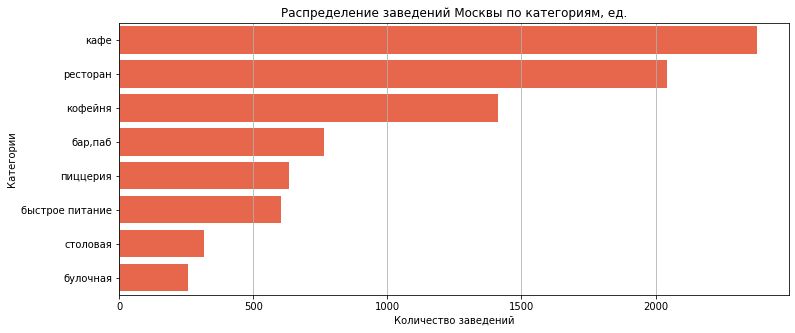

<Figure size 864x360 with 0 Axes>

In [14]:
#Создадим сводную таблицу
category_pivot = data.pivot_table(
    index='category', values='name', aggfunc='count').sort_values(
    by='name', ascending=False).reset_index()
category_pivot.columns = ['category', 'places']
category_pivot['share, %'] = round((category_pivot['places'] / category_pivot['places'].sum()), 4)*100
print(category_pivot)

#Выведем график c числом заведений по категориям
plt.figure(figsize=(12,5))
plt.title('Распределение заведений Москвы по категориям, ед.')
plt.grid(True)
sns.barplot(data=category_pivot, color = '#FF5733', x='places', y='category')
plt.xlabel('Количество заведений')
plt.ylabel('Категории')

#Выведем круговую диаграмму с долями заведений по категориям
plt.figure(figsize=(12,5))
fig = px.pie(category_pivot, values='places', names='category', title='Доли заведений Москвы по категориям, %')
fig.show()

Больше всего в Москве заведений категории кафе (28.3%), на втором месте рестораны (24.3%), на третьем месте кофейни (16.8%).

Меньше всего булочных (3.05%) и столовых (3.75%).

### Посадочные места

75.0
108.42168925964546


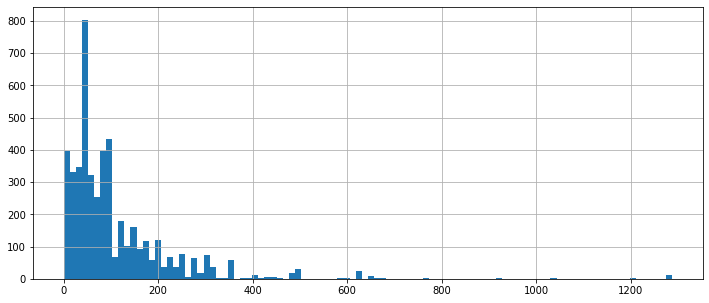

In [15]:
#Изучим общую картину распределения количества мест по всем категориям
plt.figure(figsize=(12,5))
data['seats'].hist(bins=100)
print(data['seats'].median())
print(data['seats'].mean())

Обычно количество посадочных мест варьируется от 0 до 300-400, дальше уже идут скорее единичные аномальные случаи. Медиана и средняя сильно отличаются (75 и 108 соответсвенно). Поэтому корректно будет вывести медианное значение посадочных мест по категориям, а не среднее, чтобы смягчить влияние аномалий. 

          category  seats_median
0         ресторан          86.0
1          бар,паб          82.0
2          кофейня          80.0
3         столовая          76.0
4  быстрое питание          65.0
5             кафе          60.0
6         пиццерия          55.0
7         булочная          50.0


Text(0, 0.5, 'Категории')

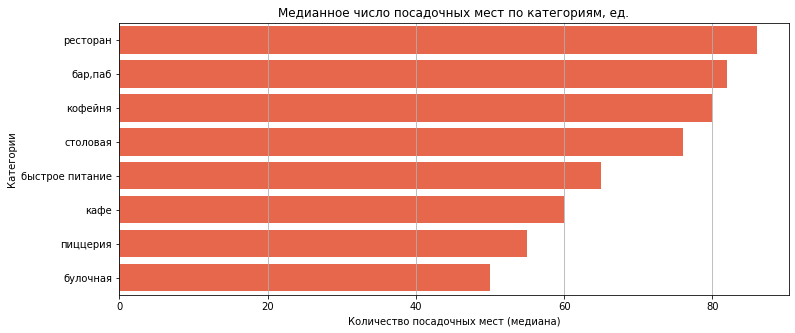

In [16]:
#Создадим сводную таблицу
seats_pivot = data.pivot_table(
    index='category', values='seats', aggfunc='median').sort_values(
    by='seats', ascending=False).reset_index()
seats_pivot.columns = ['category', 'seats_median']
seats_pivot['seats_median'] = round(seats_pivot['seats_median'])
print(seats_pivot)

#Выведем график c медианным числом посадочных мест по категориям
plt.figure(figsize=(12,5))
plt.title('Медианное число посадочных мест по категориям, ед.')
plt.grid(True)
sns.barplot(data=seats_pivot, color = '#FF5733', x='seats_median', y='category', )
plt.xlabel('Количество посадочных мест (медиана)')
plt.ylabel('Категории')

Больше всего посадочных мест в ресторанах (86 ед.), барах и пабах (82 ед.), кофейнях (80 ед.). Меньше всего в булочных (50 ед.), пиццериях (55 ед.).

### Сетевые и несетевые заведения

In [17]:
#Создадим сводную таблицу
chain_pivot = data.pivot_table(
    index='chain', values='name', aggfunc='count').sort_values(
    by='name', ascending=False).reset_index()
chain_pivot.columns = ['chain', 'places']
chain_pivot['chain'] = chain_pivot['chain'].map({1:'сетевой',0:'несетевой'})
chain_pivot['share, %'] = round((chain_pivot['places'] / chain_pivot['places'].sum()), 4)*100
print(chain_pivot)

#Выведем круговую диаграмму с долями сетевых и несетевых заведений
plt.figure(figsize=(12,5))
fig = px.pie(chain_pivot, values='places', names='chain', title='Доли сетевых и несетевых заведений Москвы по категориям, %')
fig.show()

       chain  places  share, %
0  несетевой    5201     61.87
1    сетевой    3205     38.13


<Figure size 864x360 with 0 Axes>

           category      chain  places  share, %
0           бар,паб  несетевой     596      7.09
1           бар,паб    сетевой     169      2.01
2          булочная  несетевой      99      1.18
3          булочная    сетевой     157      1.87
4   быстрое питание  несетевой     371      4.41
5   быстрое питание    сетевой     232      2.76
6              кафе  несетевой    1599     19.02
7              кафе    сетевой     779      9.27
8           кофейня  несетевой     693      8.24
9           кофейня    сетевой     720      8.57
10         пиццерия  несетевой     303      3.60
11         пиццерия    сетевой     330      3.93
12         ресторан  несетевой    1313     15.62
13         ресторан    сетевой     730      8.68
14         столовая  несетевой     227      2.70
15         столовая    сетевой      88      1.05


Text(0, 0.5, 'Количество заведений')

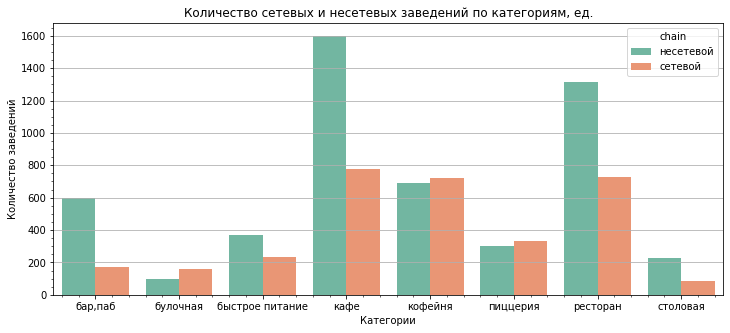

In [18]:
#Создадим сводную таблицу
category_chain_pivot = data.pivot_table(
    index=['category', 'chain'], values=['name'], aggfunc='count').sort_values(
    by='category').reset_index()
category_chain_pivot.columns = ['category', 'chain', 'places']
category_chain_pivot['chain'] = category_chain_pivot['chain'].map({1:'сетевой',0:'несетевой'})
category_chain_pivot['share, %'] = round((category_chain_pivot['places'] / category_chain_pivot['places'].sum()), 4)*100
print(category_chain_pivot)

#Выведем график c распределением сетевых и несетевых заведенений по категориям
plt.figure(figsize=(12,5))
plt.title('Количество сетевых и несетевых заведений по категориям, ед.')
plt.minorticks_on()
plt.grid(True)
sns.barplot(data=category_chain_pivot, x='category', y='places', hue = 'chain', palette = 'Set2')
plt.xlabel('Категории')
plt.ylabel('Количество заведений')

Доля сетевых заведений составляет более трети - 38.1%, несетевых - 61.9%.
Больше всего сетевых заведений встречается среди кафе, ресторанов и кофеен. Меньше всего - среди столовых, булочных и баров / пабов.

                                   name  category  places
0                           Шоколадница   кофейня     119
1                        Домино'с Пицца  пиццерия      76
2                            Додо Пицца  пиццерия      74
3                      One Price Coffee   кофейня      71
4                          Яндекс Лавка  ресторан      69
5                                 Cofix   кофейня      65
6                                 Prime  ресторан      49
7                              КОФЕПОРТ   кофейня      42
8   Кулинарная лавка братьев Караваевых      кафе      39
9                               Теремок  ресторан      36
10                             CofeFest   кофейня      31
11                              Чайхана      кафе      26
12                              Буханка  булочная      25
13                           Drive Café      кафе      24
14                            Кофемания   кофейня      22


Text(0, 0.5, 'Названия заведений')

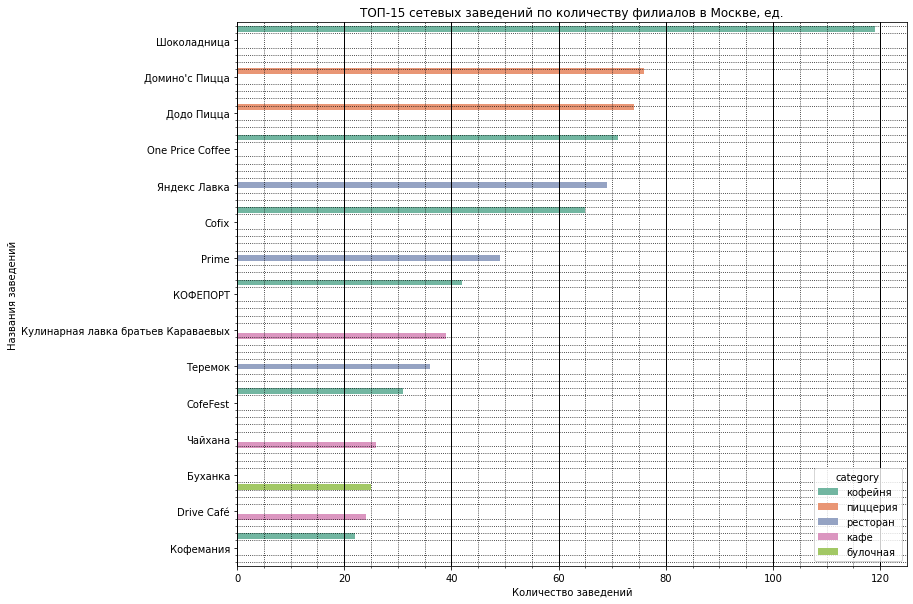

In [19]:
#Выведем ТОП-15 сетевых заведений по количеству филиалов 
top_chains = data[data['chain']==1].pivot_table(
    index=['name', 'category'], values=['address'], aggfunc='count').sort_values(by='address', ascending=False).reset_index()
top_chains.columns = ['name', 'category', 'places']
top_15_chains = top_chains.head(15)
print(top_15_chains)

#Построим график
plt.figure(figsize=(12,10))
plt.title('ТОП-15 сетевых заведений по количеству филиалов в Москве, ед.')
plt.minorticks_on()
plt.grid(which='major',
        color = 'k', 
        linewidth = 1)
plt.grid(which='minor', 
        color = 'k', 
        linestyle = ':')
sns.barplot(data=top_15_chains, x='places', y='name', hue = 'category', palette = 'Set2')
plt.xlabel('Количество заведений')
plt.ylabel('Названия заведений')

In [20]:
# Посчитаем какие категории вошли в ТОП-15
top_15_chains.groupby('category')['category'].count().sort_values(ascending=False)

category
кофейня     6
кафе        3
ресторан    3
пиццерия    2
булочная    1
Name: category, dtype: int64

Больше всего заведений у сетевой кофейни Шоколадница - 119 филиалов, на втором месте Домино'с Пицца  - 76 филиалов, Додо Пицца - 74 филиала. В ТОП-15 сетевых заведений вошли 6 кофеен, 3 кафе, 3 ресторана, 2 пиццерии и 1 булочная.

### Административные районы

In [21]:
# Изучим расределение заведений по районам
district_pivot = data.pivot_table(
    index=['district'], values=['name'], aggfunc='count').sort_values(
    by='name', ascending=False).reset_index()
district_pivot.columns = ['district', 'places']
print(district_pivot)

#Выведем круговую диаграмму с количеством заведений по районам
plt.figure(figsize=(12,5))
fig = px.pie(district_pivot, values='places', names='district', title='Распределение заведений по административным районам, %')
fig.show()

                                  district  places
0       Центральный административный округ    2242
1          Северный административный округ     900
2             Южный административный округ     892
3  Северо-Восточный административный округ     891
4          Западный административный округ     851
5         Восточный административный округ     798
6     Юго-Восточный административный округ     714
7      Юго-Западный административный округ     709
8   Северо-Западный административный округ     409


<Figure size 864x360 with 0 Axes>

Более четверти заведений общественного питания Москвы находится в ЦАО, далее по популярности САО и ЮАО. Меньше всего заведений в СЗАО и ЮЗАО.

                            district         category  places
0   Восточный административный округ          бар,паб      53
1   Восточный административный округ         булочная      25
2   Восточный административный округ  быстрое питание      71
3   Восточный административный округ             кафе     272
4   Восточный административный округ          кофейня     105
..                               ...              ...     ...
67      Южный административный округ  быстрое питание      85
68      Южный административный округ             кафе     264
69      Южный административный округ          кофейня     131
70      Южный административный округ         пиццерия      73
71      Южный административный округ         столовая      44

[72 rows x 3 columns]


Text(0, 0.5, 'Административные районы')

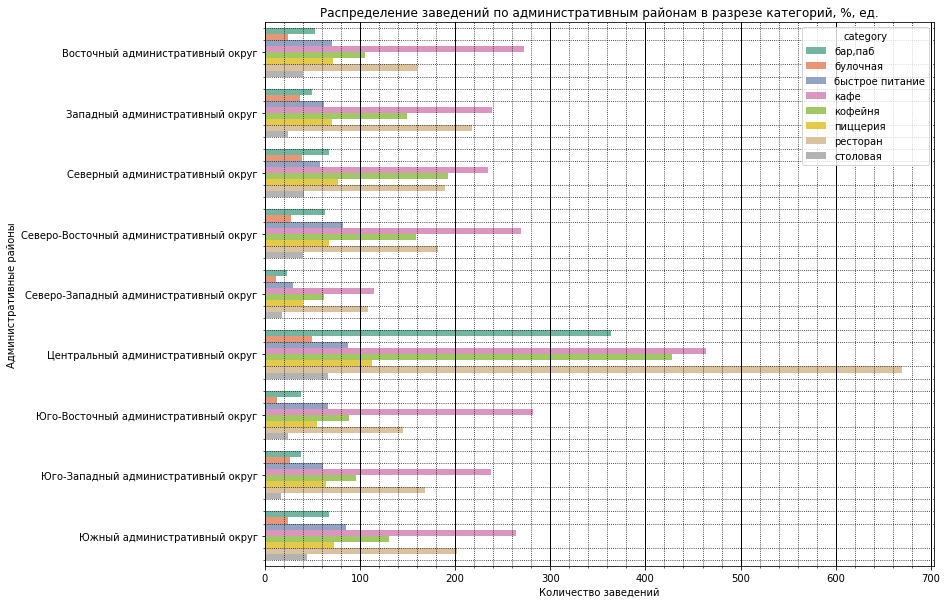

In [22]:
# Изучим как распределены заведения по районам в разрезе категорий
district_category_pivot = data.pivot_table(
    index=['district', 'category'], values=['name'], aggfunc='count').sort_values(
    by='district', ascending=True).reset_index()
district_category_pivot.columns = ['district', 'category', 'places']

print(district_category_pivot)

# Построим столбчатую диаграмму
plt.figure(figsize=(12,10))
plt.title('Распределение заведений по административным районам в разрезе категорий, %, ед.')
plt.minorticks_on()
plt.grid(which='major',
        color = 'k', 
        linewidth = 1)
plt.grid(which='minor', 
        color = 'k', 
        linestyle = ':')
sns.barplot(data=district_category_pivot, x='places', y='district', hue = 'category', palette = 'Set2')
plt.xlabel('Количество заведений')
plt.ylabel('Административные районы')

### Рейтинги заведений

          category  rating_mean
0          бар,паб         4.39
1         пиццерия         4.30
2         ресторан         4.29
3          кофейня         4.28
4         булочная         4.27
5         столовая         4.21
6             кафе         4.12
7  быстрое питание         4.05


Text(0, 0.5, 'Категории')

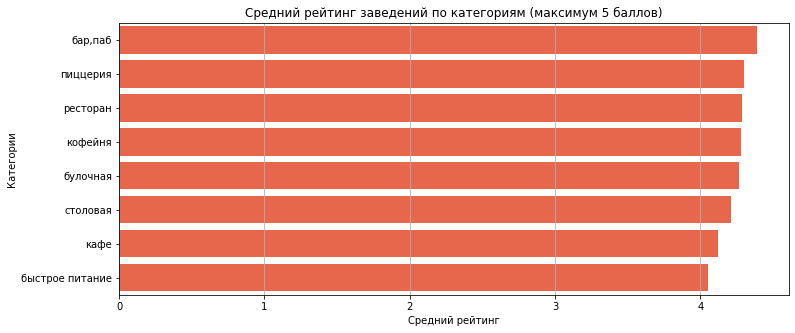

In [23]:
# Выведем средние рейтинги заведений по категориям
rating_pivot = data.pivot_table(
    index=['category'], values=['rating'], aggfunc='mean').sort_values(
    by='rating', ascending=False).reset_index()
rating_pivot.columns = ['category', 'rating_mean']
rating_pivot['rating_mean'] = round(rating_pivot['rating_mean'], 2)
print(rating_pivot)

#Выведем график cо средним рейтингом по категориям
plt.figure(figsize=(12,5))
plt.title('Средний рейтинг заведений по категориям (максимум 5 баллов)')
plt.grid(True)
sns.barplot(data=rating_pivot, color = '#FF5733', x='rating_mean', y='category')
plt.xlabel('Средний рейтинг')
plt.ylabel('Категории')

Средний рейтинг в разрезе категорий не сильно отличается. Самый высокий средний рейтинг у баров и пабов (4.39 баллов), а самый низкий у заведений быстрого питания (4.05 баллов)

In [24]:
# Посмотрим какие рейтинги получают заведения в разрезе на административные районы

rating_district_pivot = data.pivot_table(
    index=['district'], values=['rating'], aggfunc='mean').sort_values(
    by='rating', ascending=False).reset_index()
rating_district_pivot.columns = ['district', 'rating_mean']
rating_district_pivot['rating_mean'] = round(rating_district_pivot['rating_mean'], 2)
print(rating_district_pivot)

                                  district  rating_mean
0       Центральный административный округ         4.38
1          Северный административный округ         4.24
2   Северо-Западный административный округ         4.21
3             Южный административный округ         4.18
4          Западный административный округ         4.18
5         Восточный административный округ         4.17
6      Юго-Западный административный округ         4.17
7  Северо-Восточный административный округ         4.15
8     Юго-Восточный административный округ         4.10


In [25]:
# Читаем файл с геоданными и сохраняем в переменной
with open('/datasets/admin_level_geomap.geojson', 'r') as f:
    geo_json = json.load(f)

In [26]:
moscow_lat, moscow_lng = 55.751244, 37.618423
state_geo = '/datasets/admin_level_geomap.geojson'

# Создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# Создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_district_pivot,
    columns=['district', 'rating_mean'],
    key_on='feature.name',
    fill_color='OrRd',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)

# Выводим карту
m

В Центральном административном округе самый высокий средний рейтинг - 4.38 балла, самый низкий в Юго-Восточном округе - 4.1 балла . Скорее всего рейтинги зависят от плотности населения / проходимости, которая подразумевает высокую конкуренцию и как следствие более качественный сервис.

### География заведений 

In [27]:
# Отобразим все заведения датасета на карте
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
marker_cluster = MarkerCluster().add_to(m)

def create_clusters(row):
    icon_url = 'https://img.icons8.com/parakeet/512/meal.png'  
    icon = CustomIcon(icon_url, icon_size=(30, 30))
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
        icon=icon,
    ).add_to(marker_cluster)
data.apply(create_clusters, axis=1)
m

По карте видно, что плотность размещения заведений неравномерно уменьшается от центра к периферии. На Северо-Западе, Севере, Западе плотность выше, чем на Юге, Юго-Востоке и Востоке.  

### ТОП-15 улиц

In [28]:
# Выведем ТОП-15 улиц по количеству заведений
street_pivot = data.pivot_table(
    index=['street'], values=['name'], aggfunc='count').sort_values(
    by='name', ascending=False).reset_index()
street_pivot.columns = ['street', 'total_places']
top_15_streets = street_pivot.head(15)
print(top_15_streets)

# Построим сводную таблицу по названиям улиц и категориям 
street_category_pivot = data.pivot_table(
    index=['street', 'category'], values=['name'], aggfunc='count').sort_values(
    by='street', ascending=False).reset_index()
street_category_pivot.columns = ['street', 'category', 'places']

# Соединим таблицы так, чтобы остались только ТОП-15 улиц
top_15_streets = top_15_streets.merge(street_category_pivot, how='inner', on='street')
print(top_15_streets)

                    street  total_places
0            проспект Мира           184
1        Профсоюзная улица           122
2     проспект Вернадского           108
3       Ленинский проспект           107
4   Ленинградский проспект            95
5        Дмитровское шоссе            88
6          Каширское шоссе            77
7         Варшавское шоссе            75
8      Ленинградское шоссе            69
9                     МКАД            65
10        Люблинская улица            60
11          улица Вавилова            55
12    Кутузовский проспект            54
13    улица Миклухо-Маклая            49
14         Пятницкая улица            48
              street  total_places         category  places
0      проспект Мира           184             кафе      53
1      проспект Мира           184          бар,паб      12
2      проспект Мира           184         булочная       4
3      проспект Мира           184  быстрое питание      21
4      проспект Мира           184         п

Text(0, 0.5, 'ТОП-15 улиц по количеству заведений')

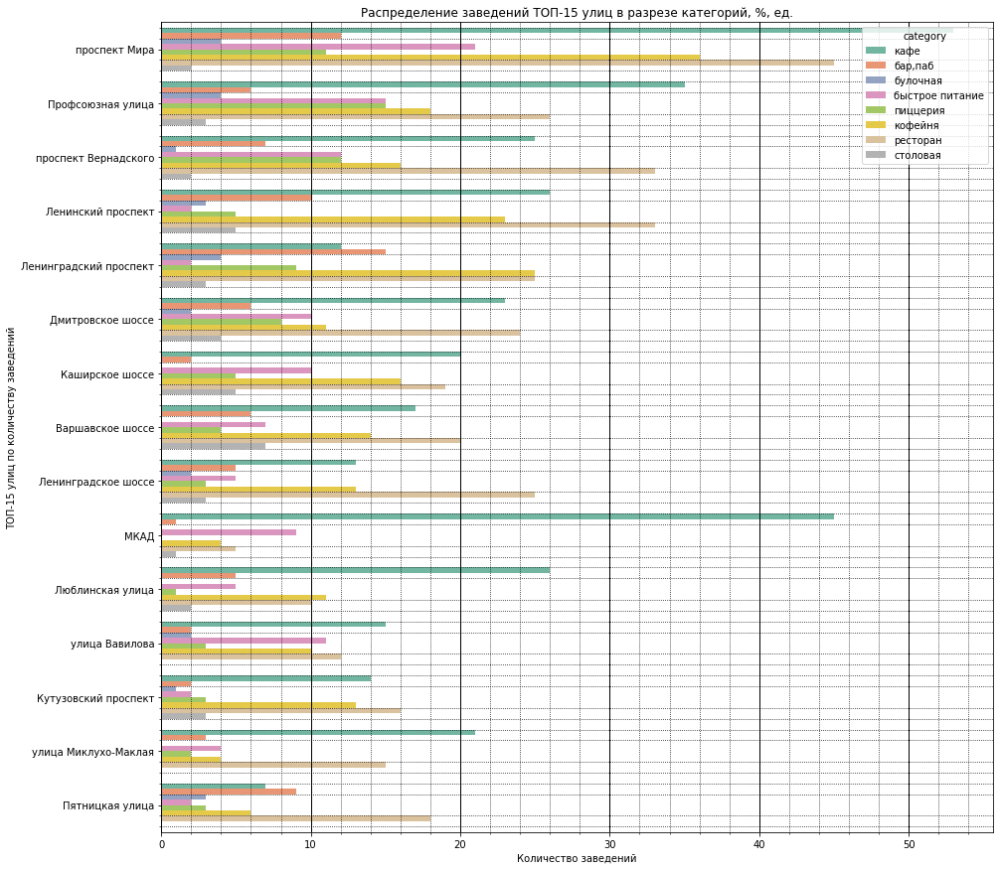

In [29]:
# Построим столбчатую диаграмму
plt.figure(figsize=(15,15))
plt.title('Распределение заведений ТОП-15 улиц в разрезе категорий, %, ед.')
plt.minorticks_on()
plt.grid(which='major',
        color = 'k', 
        linewidth = 1)
plt.grid(which='minor', 
        color = 'k', 
        linestyle = ':')
sns.barplot(data=top_15_streets, x='places', y='street', hue = 'category', palette = 'Set2')
plt.xlabel('Количество заведений')
plt.ylabel('ТОП-15 улиц по количеству заведений')

В ТОП-15 вошли улицы с плотностью завдений общественно питания от 48 до 184 единиц. Многие из представленных улиц имеют большую протяженность. Например, проспект Мира - 8,9 км., Профсоюзная улица - 9.3 км., Ленинский проспект - 16 км.

### Улицы с 1 заведением

In [30]:
#Выведем список улиц, на которых находится только один объект общепита
few_places_street = street_pivot[street_pivot['total_places']==1]
few_places_street

,street,total_places
971,улица Кутузова,1
972,Большой Волоколамский проезд,1
973,1-й Николощеповский переулок,1
974,1-й Новокузнецкий переулок,1
975,Большой Кисловский переулок,1
...,...,...
1382,улица 8-я Линия,1
1383,Красностуденческий проезд,1
1384,Краснохолмская набережная,1
1385,Красноярская улица,1


Есть 416 улиц, на которых есть только по 1 заведению общественного питания. Пока по списку нельзя сделать никаких выводов, посмотрим как распределены они по районам и категориям.

In [31]:
few_places_street = few_places_street.merge(data, how='inner', on='street')

In [32]:
few_places_street['district'].value_counts()

Центральный административный округ         135
Северо-Восточный административный округ     49
Восточный административный округ            48
Северный административный округ             46
Южный административный округ                36
Западный административный округ             35
Юго-Восточный административный округ        32
Северо-Западный административный округ      18
Юго-Западный административный округ         17
Name: district, dtype: int64

In [33]:
few_places_street['category'].value_counts()

кафе               138
ресторан            88
кофейня             74
бар,паб             40
столовая            36
быстрое питание     17
пиццерия            14
булочная             9
Name: category, dtype: int64

В Центральном административном округе больше всего улиц всего с одним заведением общественного питания - 138 единиц. Скорее всего это связано с тем, что в центр Москвы содержит много улиц с небольшой протяженностью. В целом такие улицы есть в каждом из районов. Чаще всего среди "одиночек" встречаются кафе, рестораны и кофейни.

### Сравнение средних чеков

In [34]:
# Посмотрим какие средние чеки получают заведения в разрезе на административные районы

bill_pivot = data.pivot_table(
    index=['district'], values=['middle_avg_bill'], aggfunc='median').sort_values(
    by='middle_avg_bill', ascending=False).reset_index()
bill_pivot

,district,middle_avg_bill
0,Западный административный округ,1000.0
1,Центральный административный округ,1000.0
2,Северо-Западный административный округ,700.0
3,Северный административный округ,650.0
4,Юго-Западный административный округ,600.0
5,Восточный административный округ,575.0
6,Северо-Восточный административный округ,500.0
7,Южный административный округ,500.0
8,Юго-Восточный административный округ,450.0


In [35]:
moscow_lat, moscow_lng = 55.751244, 37.618423
state_geo = '/datasets/admin_level_geomap.geojson'

m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
Choropleth(
    geo_data=state_geo,
    data=bill_pivot,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='OrRd',
    fill_opacity=0.8,
    legend_name='Медиана среднего чека заведений по районам',
).add_to(m)

m

Самый высокий чек в Центральном и Западном административных округах - 1000 рублей. Эти районы считаются престижными - популярные среди туристов локации, бизнес-центры, университеты и др. Самые низкие чеки в Юго-Восточном (450 рублей), Северо-Восточном, Южном административных округах (по 500 рублей) - в 2 и более раза ниже, чем в Центральном и Западном. 

Медиана среднего чека зависит не напрямую от расстояния до центра города, а скорее от инфрастурктуры, плотности насления, плотности бизнеса, общей проходимости, конкуренции.

###  Выводы

- Больше всего в Москве заведений категории кафе (28.3%), на втором месте рестораны (24.3%), на третьем месте кофейни (16.8%). Меньше всего булочных (3.05%) и столовых (3.75%).

- Больше всего посадочных мест в ресторанах (86 ед.), барах и пабах (82 ед.), кофейнях (80 ед.). Меньше всего в булочных (50 ед.), пиццериях (55 ед.).

- Доля сетевых заведений составляет более трети - 38.1%, несетевых - 61.9%. Больше всего сетевых заведений встречается среди кафе, ресторанов и кофеен. Меньше всего - среди столовых, булочных и баров / пабов.

- Более четверти заведений общественного питания Москвы находится в ЦАО, далее по популярномти САО и ЮАО. Меньше всего заведений в СЗАО и ЮЗАО. В целом заметна популярность во всех районах Москвы кафе и ресторанов. По графику виднео, что в центре города есть тенденция к популярности баров и пабов, кофеен.

- Средний рейтинг в разрезе категорий не сильно отличается. Самый высокий средний рейтинг у баров и пабов (4.4 балла), а самый низкий у заведений быстрого питания (4.1 балл). В ЦАО самый высокий средний рейтинг - 4.4 балла, самый низкий в ЮВАО - 4.1 балла. Скорее всего рейтинги зависят от плотности населения / проходимости, которая подразумевает высокую конкуренцию и как следствие более качественный сервис.

- В ТОП-15 вошли улицы с плотностью заведений общественно питания от 48 до 184 единиц. Многие из представленных улиц имеют большую протяженность. Например, проспект Мира - 8,9 км., Профсоюзная улица - 9.3 км., Ленинский проспект - 16 км.

- Есть 416 улиц, на которых есть только по 1 заведению общественного питания. В ЦАО больше всего улиц всего с одним заведением общественного питания - 138 единиц. Скорее всего это связано с тем, что в центр Москвы содержит много улиц с небольшой протяженностью. В целом такие улицы есть в каждом из районов. Чаще всего среди "одиночек" встречаются кафе, рестораны и кофейни.

- Самый высокий чек в ЦАО и ЗАО - 1000 рублей. Эти районы считаются престижными - популярные среди туристов локации, бизнес-центры, университеты и др. Самые низкие чеки в ЮВАО (450 рублей), СВАО, ЮАО (по 500 рублей) - в 2 и более раза ниже, чем в ЦАО и ЗАО. Медиана среднего чека зависит не напрямую от расстояния до центра города, а скорее от инфрастурктуры, плотности насления, плотности бизнеса, общей проходимости. 

## Анализ рынка кофеен

Заказчик детально рассматривает возможность открытия уютной и доступной кофейни в Москве. Изучим более подробно как обстоят дела с кофейнями.

### Кофейни по районам

In [36]:
# Посчитаем количество всех кофеен в Москве и их долю среди всех заведений общественного питания
coffee_houses = data[data['category']=='кофейня']
coffee_houses['name'].count()

1413

In [37]:
#Изучим распределение кофеен по районам Москвы
coffee_houses_district = coffee_houses.pivot_table(
    index=['district'], values='name', aggfunc='count').sort_values(
    by='name', ascending=False).reset_index()
coffee_houses_district.columns = ['district', 'coffee_houses']
coffee_houses_district['share, %'] = round((coffee_houses_district['coffee_houses']/1413)*100, 2)
display(coffee_houses_district)

#Выведем круговую диаграмму с долями кофеен по округам
plt.figure(figsize=(12,5))
fig = px.pie(coffee_houses_district, values='coffee_houses', names='district', title='Доли кофеен Москвы по округам, %')
fig.show()

,district,coffee_houses,"share, %"
0,Центральный административный округ,428,30.29
1,Северный административный округ,193,13.66
2,Северо-Восточный административный округ,159,11.25
3,Западный административный округ,150,10.62
4,Южный административный округ,131,9.27
5,Восточный административный округ,105,7.43
6,Юго-Западный административный округ,96,6.79
7,Юго-Восточный административный округ,89,6.30
8,Северо-Западный административный округ,62,4.39


<Figure size 864x360 with 0 Axes>

Всего в Москве 1413 кофеен, что составляет 16.8% всех заведений общественного питания. Лидером по размещению кофеен является ЦАО, в этом округе находится почти треть - 428 ед. (30.29%). На втором месте САО - 193 ед. (13.66%).
Меньше всего кофеен в СЗАО - 62 ед.(4.39%).

### Сетевой и несетовой формат

In [38]:
#Изучим сколько сетевых и несетевых кофеен есть 
coffee_houses_chain = coffee_houses.pivot_table(
    index='chain', values='name', aggfunc='count').sort_values(
    by='name', ascending=False).reset_index()
coffee_houses_chain.columns = ['chain', 'coffee_houses']
coffee_houses_chain['chain'] = coffee_houses_chain['chain'].map({1:'сетевой',0:'несетевой'})
print(coffee_houses_chain)

       chain  coffee_houses
0    сетевой            720
1  несетевой            693


,district,chain,coffee_houses,"share, %"
0,Восточный административный округ,несетевой,515,6.13
1,Восточный административный округ,сетевой,283,3.37
2,Западный административный округ,несетевой,475,5.65
3,Западный административный округ,сетевой,376,4.47
4,Северный административный округ,несетевой,553,6.58
5,Северный административный округ,сетевой,347,4.13
6,Северо-Восточный административный округ,несетевой,557,6.63
7,Северо-Восточный административный округ,сетевой,334,3.97
8,Северо-Западный административный округ,сетевой,156,1.86
9,Северо-Западный административный округ,несетевой,253,3.01


Text(0, 0.5, 'Административные районы')

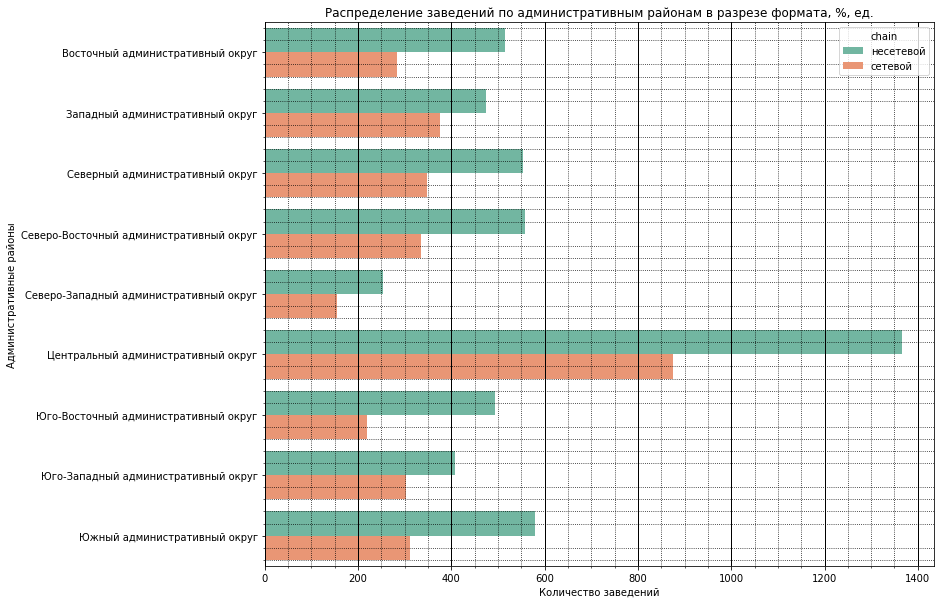

In [39]:
#Разделим сетевые и несетевые кофейни по районам
coffee_houses_chain_district = data.pivot_table(
    index=['district', 'chain'], values=['name'], aggfunc='count').sort_values(
    by='district').reset_index()
coffee_houses_chain_district.columns = ['district', 'chain', 'coffee_houses']
coffee_houses_chain_district['chain'] = coffee_houses_chain_district['chain'].map({1:'сетевой',0:'несетевой'})
coffee_houses_chain_district['share, %'] = round((coffee_houses_chain_district['coffee_houses'] / coffee_houses_chain_district['coffee_houses'].sum()), 4)*100
display(coffee_houses_chain_district)

# Построим столбчатую диаграмму
plt.figure(figsize=(12,10))
plt.title('Распределение заведений по административным районам в разрезе формата, %, ед.')
plt.minorticks_on()
plt.grid(which='major',
        color = 'k', 
        linewidth = 1)
plt.grid(which='minor', 
        color = 'k', 
        linestyle = ':')
sns.barplot(data=coffee_houses_chain_district, x='coffee_houses', y='district', hue = 'chain', palette = 'Set2')
plt.xlabel('Количество заведений')
plt.ylabel('Административные районы')

In [40]:
#Выведщем ТОП-15 сетевых кофеен по количеству филиалов 
top_coffee_chains = coffee_houses[coffee_houses['chain']==1].pivot_table(
    index=['name', 'category'], values=['address'], aggfunc='count').sort_values(by='address', ascending=False).reset_index()
top_coffee_chains.columns = ['name', 'category', 'places']
top_5_coffee_chains = top_coffee_chains.head(5)
top_5_coffee_chains

,name,category,places
0,Шоколадница,кофейня,119
1,One Price Coffee,кофейня,71
2,Cofix,кофейня,65
3,КОФЕПОРТ,кофейня,42
4,CofeFest,кофейня,31


Почти половина всех кофеен (49%) являются сетевыми. В ЦАО очень высокая концентрация - в нем находится каждая десятая кофейня сетевого формата.

### Режим работы кофеен

In [41]:
#Изучим распределение кофеен по районам Москвы в разрезе круглосуточного и некруглосуточного режима работы
coffee_houses_district_allday = coffee_houses.pivot_table(
    index=['district', 'is_24/7'], values='name', aggfunc='count').sort_values(
    by='district', ascending=False).reset_index()
coffee_houses_district_allday.columns = ['district', 'is_24/7', 'coffee_houses']
coffee_houses_district_allday['share, %'] = round((coffee_houses_district_allday['coffee_houses']/1413)*100, 2)
coffee_houses_district_allday['is_24/7'] = coffee_houses_district_allday['is_24/7'].map({True:'круглосуточный',0:'некруглосуточный'})
display(coffee_houses_district_allday)

,district,is_24/7,coffee_houses,"share, %"
0,Южный административный округ,круглосуточный,1,0.07
1,Южный административный округ,некруглосуточный,130,9.20
2,Юго-Западный административный округ,круглосуточный,7,0.50
3,Юго-Западный административный округ,некруглосуточный,89,6.30
4,Юго-Восточный административный округ,круглосуточный,1,0.07
5,Юго-Восточный административный округ,некруглосуточный,88,6.23
6,Центральный административный округ,некруглосуточный,402,28.45
7,Центральный административный округ,круглосуточный,26,1.84
8,Северо-Западный административный округ,круглосуточный,2,0.14
9,Северо-Западный административный округ,некруглосуточный,60,4.25


In [42]:
# Посмотрим на общую картину сколько кофеен работают круглосуточно и некруглосуточно 
display(coffee_houses_district_allday.pivot_table(
    index=['is_24/7'], values='coffee_houses', aggfunc='sum').sort_values(
    by='coffee_houses', ascending=False).reset_index())

,is_24/7,coffee_houses
0,некруглосуточный,1354
1,круглосуточный,59


Text(0, 0.5, 'Административные районы')

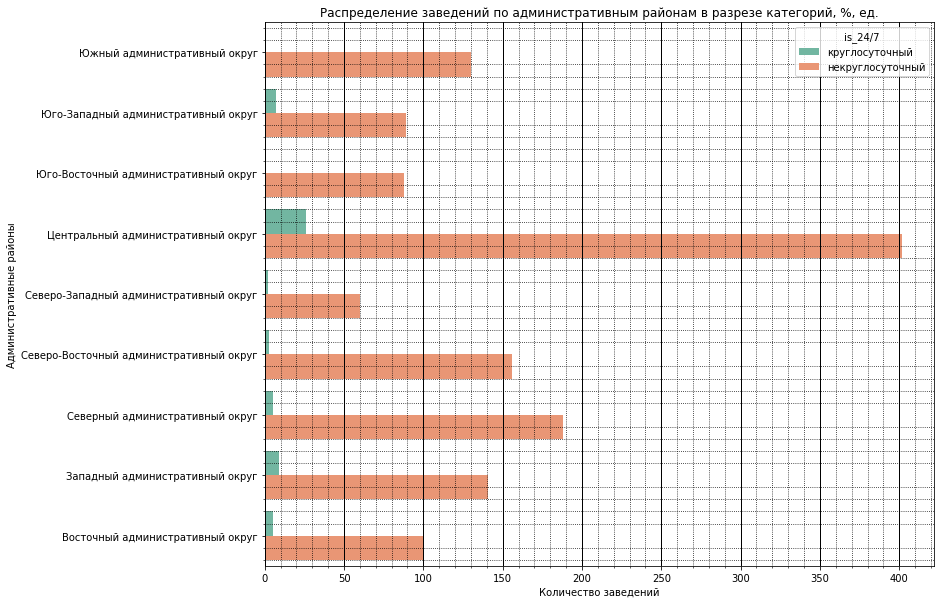

In [43]:
# Построим столбчатую диаграмму
plt.figure(figsize=(12,10))
plt.title('Распределение заведений по административным районам в разрезе категорий, %, ед.')
plt.minorticks_on()
plt.grid(which='major',
        color = 'k', 
        linewidth = 1)
plt.grid(which='minor', 
        color = 'k', 
        linestyle = ':')
sns.barplot(data=coffee_houses_district_allday, x='coffee_houses', y='district', hue = 'is_24/7', palette = 'Set2')
plt.xlabel('Количество заведений')
plt.ylabel('Административные районы')

Круглосуточный режим в работе кофеен не является популярным, по всей Москве таких заведений всего 59 ед. (5.3%). Почти половина из них находитсяв ЦАО (26 ед.). Это можно объяснить тем, что сам формат кофейни предполагает подачу кофе, десертов, перекусов и пр., что больше применимо к дневному времяпровождению. Обычно кофейни работают с раннего утра (с 8-9 ч.) до вечера. Чаще всего круглосуточно работают заведения быстрого питания и бары.

### Рейтинги кофеен

4.3
4.27728237791932


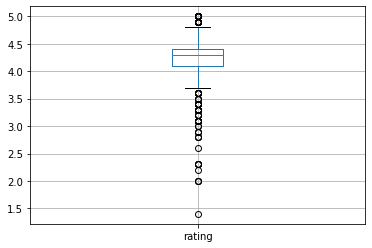

In [44]:
# Посмотрим на распределение рейтингов среди кофеен
coffee_houses.boxplot('rating')
# Посчитаем медиану и среднюю рейтингов
print(coffee_houses['rating'].median())
print(coffee_houses['rating'].mean())

                                  district  rating_mean
0       Центральный административный округ         4.34
1   Северо-Западный административный округ         4.33
2          Северный административный округ         4.29
3      Юго-Западный административный округ         4.28
4         Восточный административный округ         4.28
5             Южный административный округ         4.23
6     Юго-Восточный административный округ         4.23
7  Северо-Восточный административный округ         4.22
8          Западный административный округ         4.20


Text(0, 0.5, 'Административные районы')

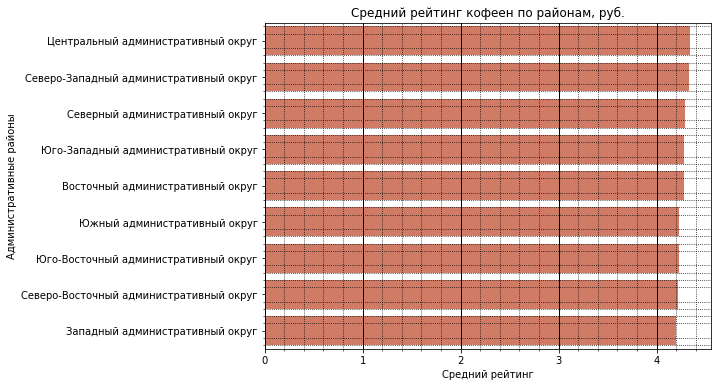

In [45]:
# Посмотрим какие рейтинги получают кофейни в разрезе на административные районы

coffee_houses_rating = coffee_houses.pivot_table(
    index=['district'], values=['rating'], aggfunc='mean').sort_values(
    by='rating', ascending=False).reset_index()
coffee_houses_rating.columns = ['district', 'rating_mean']
coffee_houses_rating['rating_mean'] = round(coffee_houses_rating['rating_mean'], 2)
print(coffee_houses_rating)

plt.figure(figsize=(8,6))
plt.title('Средний рейтинг кофеен по районам, руб.')
plt.minorticks_on()
plt.grid(which='major',
        color = 'k', 
        linewidth = 1)
plt.grid(which='minor', 
        color = 'k', 
        linestyle = ':')
sns.barplot(data=coffee_houses_rating, color = '#e17055', x='rating_mean', y='district')
plt.xlabel('Средний рейтинг')
plt.ylabel('Административные районы')

In [46]:
# Построим фоновую картограмму (хороплет) с полученными значениями для каждого района
moscow_lat, moscow_lng = 55.751244, 37.618423
state_geo = '/datasets/admin_level_geomap.geojson'

m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
Choropleth(
    geo_data=state_geo,
    data=coffee_houses_rating,
    columns=['district', 'rating_mean'],
    key_on='feature.name',
    fill_color='OrRd',
    fill_opacity=0.8,
    legend_name='Средний рейтинг кофеен по районам',
).add_to(m)

m

Медианный рейтинг среди кофеен составляет 4.3 балла, средний - 4.27 баллов. Есть кофейни с рейтингом ниже 1.5 баллов и равным макисмальным 5 баллам. 
Самый высокий рейтинг в ЦАО - 4.34 балла, самый низкий в ЗАО - 4.2 балла. 

### Средний чек и цена чашки кофе

400.0
614.21
170.0
175.0556621880998


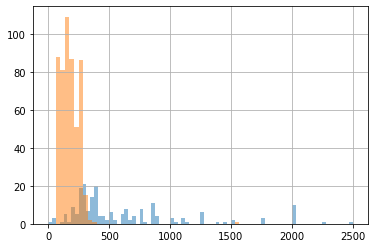

In [47]:
# Посмотрим на распределение среднего чека
coffee_houses['middle_avg_bill'].hist(bins=80, alpha = 0.5)
# Посчитаем медиану и среднюю 
print(coffee_houses['middle_avg_bill'].median())
print(coffee_houses['middle_avg_bill'].mean())

# Изучим ценовые категории на чашку капучино
# Посмотрим на распределение ценников на капучино
coffee_houses['middle_coffee_cup'].hist(bins=40, alpha = 0.5)
# Посчитаем медиану и среднюю 
print(coffee_houses['middle_coffee_cup'].median())
print(coffee_houses['middle_coffee_cup'].mean())

                                  district  middle_avg_bill  middle_coffee_cup
0          Западный административный округ            600.0              189.0
1       Центральный административный округ            500.0              190.0
2         Восточный административный округ            400.0              135.0
3             Южный административный округ            387.5              150.0
4      Юго-Западный административный округ            375.0              198.0
5          Северный административный округ            325.0              159.0
6  Северо-Восточный административный округ            325.0              162.5
7   Северо-Западный административный округ            325.0              165.0
8     Юго-Восточный административный округ            250.0              147.5


Text(0, 0.5, 'Административные районы')

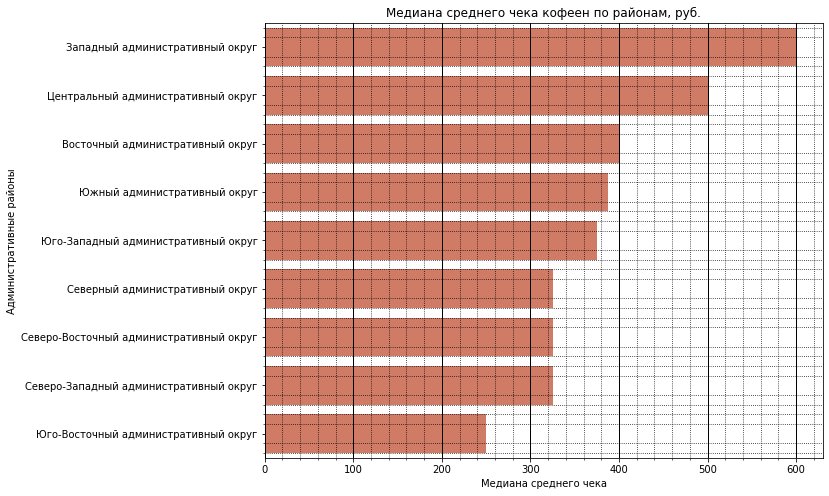

In [48]:
# Посмотрим на цены на чашку капучино в кофейнях в разрезе на административные районы

coffee_houses_price = coffee_houses.pivot_table(
    index=['district'], values=['middle_coffee_cup', 'middle_avg_bill'], aggfunc='median').sort_values(
    by='middle_avg_bill', ascending=False).reset_index()
print(coffee_houses_price)

plt.figure(figsize=(10,8))
plt.title('Медиана среднего чека кофеен по районам, руб.')
plt.minorticks_on()
plt.grid(which='major',
        color = 'k', 
        linewidth = 1)
plt.grid(which='minor', 
        color = 'k', 
        linestyle = ':')
sns.barplot(data=coffee_houses_price, color = '#e17055', x='middle_avg_bill', y='district')
plt.xlabel('Медиана среднего чека')
plt.ylabel('Административные районы')

In [49]:
# Построим фоновую картограмму (хороплет) с полученными значениями для каждого района
moscow_lat, moscow_lng = 55.751244, 37.618423
state_geo = '/datasets/admin_level_geomap.geojson'

m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
Choropleth(
    geo_data=state_geo,
    data=coffee_houses_price,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='OrRd',
    fill_opacity=0.8,
    legend_name='Медиана среднего чека кофеен по районам',
).add_to(m)

m

Text(0, 0.5, 'Административные районы')

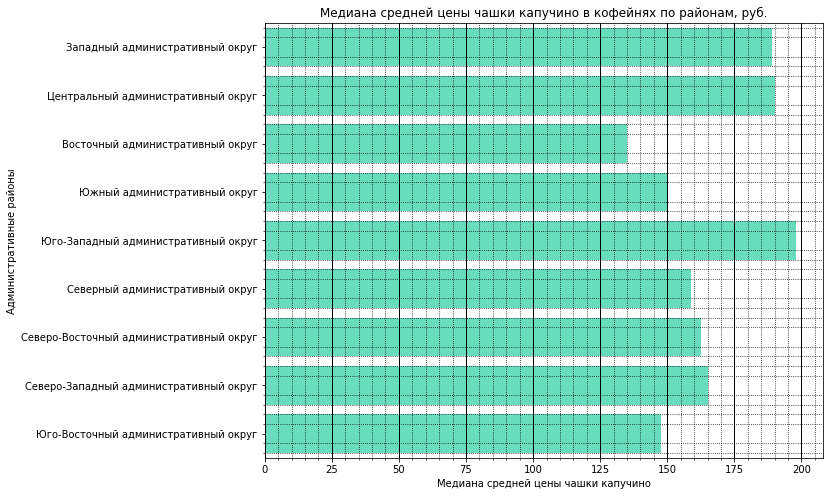

In [50]:
plt.figure(figsize=(10,8))
plt.title('Медиана средней цены чашки капучино в кофейнях по районам, руб.')
plt.minorticks_on()
plt.grid(which='major',
        color = 'k', 
        linewidth = 1)
plt.grid(which='minor', 
        color = 'k', 
        linestyle = ':')
sns.barplot(data=coffee_houses_price, color = '#55efc4', x='middle_coffee_cup', y='district')
plt.xlabel('Медиана средней цены чашки капучино')
plt.ylabel('Административные районы')

In [51]:
# Построим фоновую картограмму (хороплет) с полученными значениями для каждого района
moscow_lat, moscow_lng = 55.751244, 37.618423
state_geo = '/datasets/admin_level_geomap.geojson'

m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
Choropleth(
    geo_data=state_geo,
    data=coffee_houses_price,
    columns=['district', 'middle_coffee_cup'],
    key_on='feature.name',
    fill_color='GnBu',
    fill_opacity=0.8,
    legend_name='Медиана среднего цены чашки капучино в кофейнях по районам',
).add_to(m)

m

Самый высокий средний чек обычно бывает в ЗАО (600 руб.) и ЦАО (500 руб.), а чашка капучно в среднем стоит дорого ЮЗАО (195 руб.), ЦАО (190 руб.) и ЗАО (189 руб.).
Дешевле всего ходить в кофейни в ЮВАО (средний чек всего 250 руб., а чашка капучино обойдется в 147 руб.).

### Рекомендации по вопросам открытия кофейни

Кофейня - очень популярный формат общепита в Москве, он стоит на третьем месте по популярности после кафе и ресторанов. Всего в Москве 1413 кофеен, что составляет 16.8% всех заведений общественного питания.

**Конкуренция**
- Почти треть всех кофеен Москвы находится в ЦАО - 428 ед. (30.29%). На втором месте САО - 193 ед. (13.66%). Меньше всего кофеен в СЗАО - 62 ед.(4.39%). **Лучше выбрать место с хорошей проходимостью, концентрацией бизнес-центров, учебных заведений, культурных объектов и др.** Обычно кофейни удобны для быстрого перекуса, проведения встреч в течение рабочего дня, чтобы согреться и взбодриться в течение дня. Поэтому лучше обратить внимание на районы с высокой конкуренцией - ЦАО, САО. 

**Формат**
- Почти половина всех кофеен (49%) являются сетевыми. В ЦАО очень высокая концентрация - в нем находится каждая десятая кофейня сетевого формата. Сетевой формат означает налаженные бизнес-процессы, широкий охват и лояльных клиентов. В ТОП-5 сетевых кофеен входят Шоколадница, One Price Coffee, Cofix, КОФЕПОРТ, CofeFest. **При выборе локации следует объективно оценивать свою возможность конкурировать с сетевыми кофейнями**.

**Режим работы**
- Круглосуточный режим в работе кофеен не является популярным, по всей Москве таких заведений всего 59 ед. (5.3%). Почти половина из них находитсяв ЦАО (26 ед.). Это можно объяснить тем, что сам формат кофейни предполагает подачу кофе, десертов, перекусов, что больше применимо к дневному времяпровождению. **Лучше выбрать режим работы с раннего утра (например, с 8 ч.) и до вечера**.

**Отношение клиентов**
- Медианный рейтинг среди кофеен составляет 4.3 балла, средний - 4.27 баллов. Есть кофейни с рейтингом ниже 1.5 баллов и равным максимальным 5 баллам. Самый высокий рейтинг в ЦАО - 4.34 балла, самый низкий в ЗАО - 4.2 балла. 

**Ценовая политика**
- Самый высокий средний чек обычно бывает в ЗАО (600 руб.) и ЦАО (500 руб.), а чашка капучно в среднем стоит дорого ЮЗАО (195 руб.), ЦАО (190 руб.) и ЗАО (189 руб.). Дешевле всего ходить в кофейни в ЮВАО (средний чек всего 250 руб., а чашка капучино обойдется в 147 руб.). **Высокая медиана цен в ЗАО и ЦАО может означать, что в этих районах клиенты платежеспособны**.